# Trabajo práctico 3

**Nombre**: Cristina Arroyo Huerta

* Encontrar el logotipo de la gaseosa dentro de las imágenes provistas en Material_TPs/TP3/images a partir del template Material_TPs/TP3/template

1. (4 puntos) Obtener una detección del logo en cada imagen sin falsos positivos

In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
import os
import numpy as np
import imutils

In [3]:
def auto_canny(image):
    otsu_threshold, otsu_image = cv.threshold(image, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
    lower_threshold = 0.5 * otsu_threshold
    upper_threshold = 1.5 * otsu_threshold
    edges = cv.Canny(image, lower_threshold, upper_threshold)

    return edges

In [4]:
def find_logo(image_path, template_path, method):
    image = cv.imread(image_path)
    template = cv.imread(template_path)
    template = cv.cvtColor(template, cv.COLOR_BGR2GRAY)
    rgb_image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    template_height, template_width = template.shape[:2]

    template = auto_canny(template)

    found = None
    
    for scale in np.linspace(0.1, 4, 200):
        
        resized = imutils.resize(gray, width=int(gray.shape[1] * scale))
        
       
        if resized.shape[0] > template_height and resized.shape[1] > template_width:
            edged = auto_canny(resized)

          
            result = cv.matchTemplate(edged, template, method)
        
            
            min_val, max_val, min_loc, max_loc = cv.minMaxLoc(result)
            ratio = 1/scale
            
            cond1 = method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]
            cond2 = found is None or min_val < found[0]
            cond3 = found is None or max_val > found[0]
            
            if cond1 and cond2:
                found = (min_val, min_loc, ratio)
               
            elif cond3:
                found = (max_val, max_loc, ratio)
               
    score, point, ratio = found
    x_start, y_start = (int(point[0] * ratio), int(point[1] * ratio))
    x_end, y_end = (int((point[0] + template_width) * ratio), int((point[1] + template_height) * ratio))
    
    cv.rectangle(rgb_image, (x_start, y_start), (x_end, y_end), (0, 0, 255), 5)
    
    return rgb_image, score

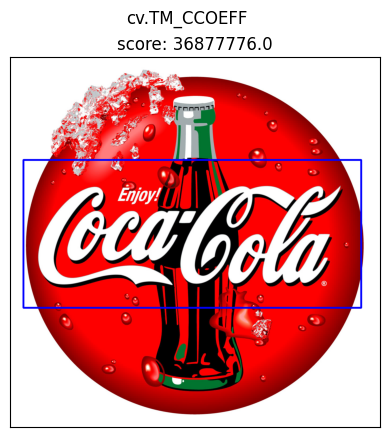

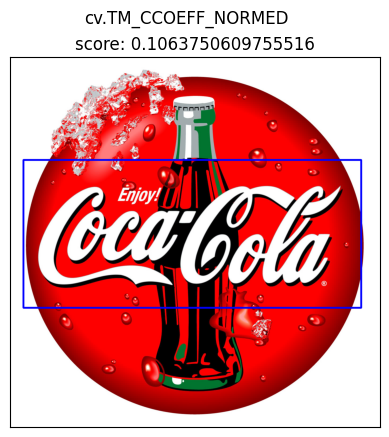

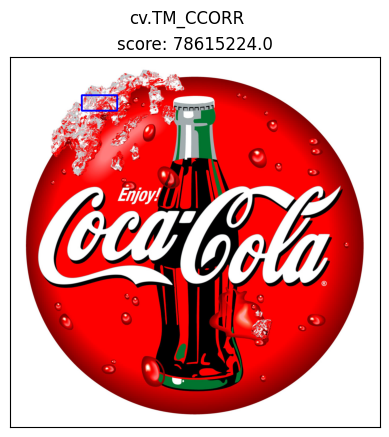

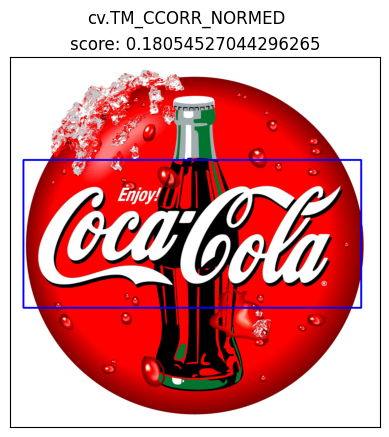

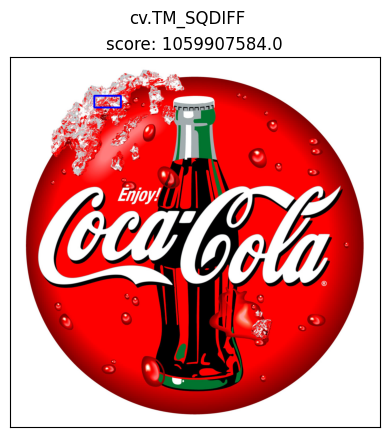

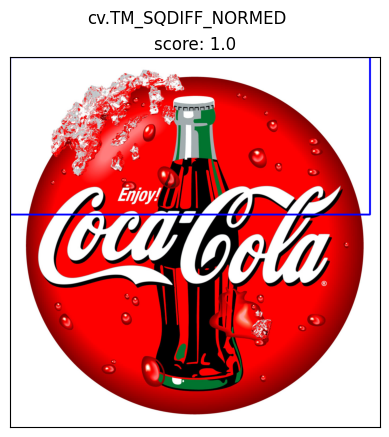

In [4]:
image_path = './images/COCA-COLA-LOGO.jpg'
template_path = './template/pattern.png'

methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']


for meth in methods:    
    method = eval(meth)
    rgb_image, score = find_logo(image_path, template_path, method)
    
    plt.figure()
    
    plt.subplot(111),plt.imshow(rgb_image)
    plt.title(f'score: {score}'), plt.xticks([]), plt.yticks([])
    
    plt.suptitle(meth)
    plt.show()


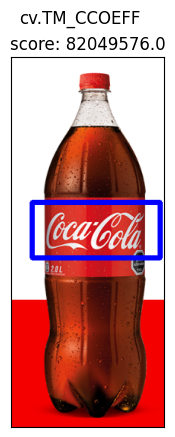

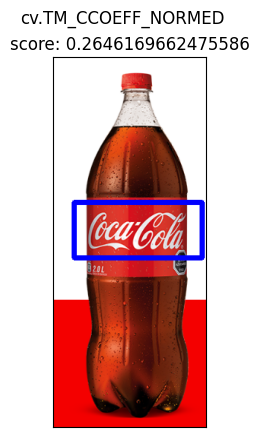

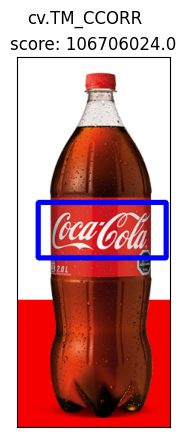

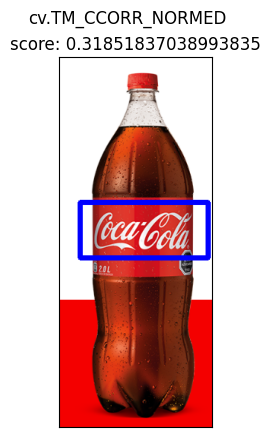

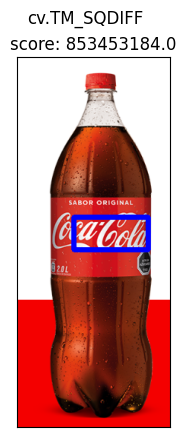

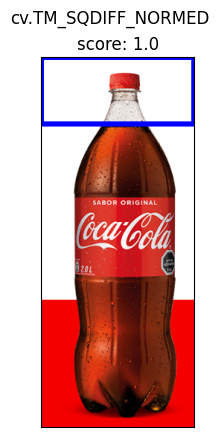

In [5]:
image_path = './images/coca_logo_1.png'
template_path = './template/pattern.png'

methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']


for meth in methods:    
    method = eval(meth)
    rgb_image, score = find_logo(image_path, template_path, method)
    
    plt.figure()
    
    plt.subplot(111),plt.imshow(rgb_image)
    plt.title(f'score: {score}'), plt.xticks([]), plt.yticks([])
    
    plt.suptitle(meth)
    plt.show()

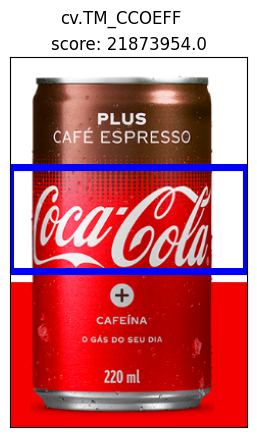

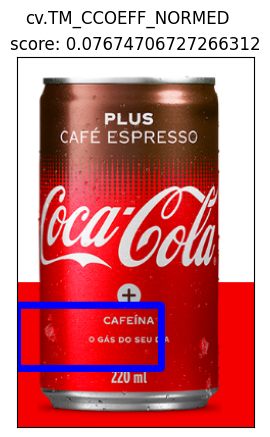

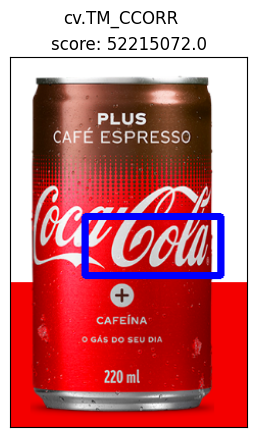

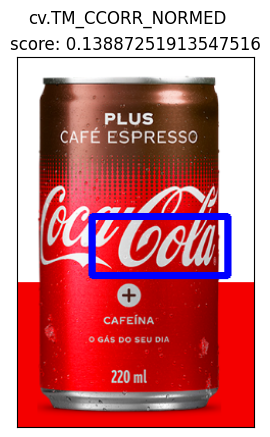

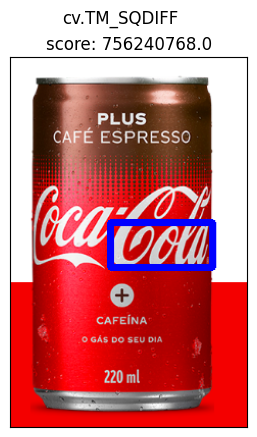

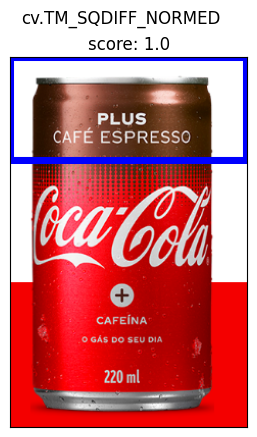

In [6]:
image_path = './images/coca_logo_2.png'
template_path = './template/pattern.png'

methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']


for meth in methods:    
    method = eval(meth)
    rgb_image, score = find_logo(image_path, template_path, method)
    
    plt.figure()
    
    plt.subplot(111),plt.imshow(rgb_image)
    plt.title(f'score: {score}'), plt.xticks([]), plt.yticks([])
    
    plt.suptitle(meth)
    plt.show()

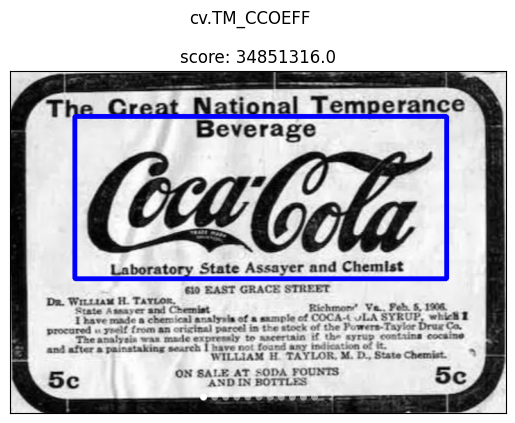

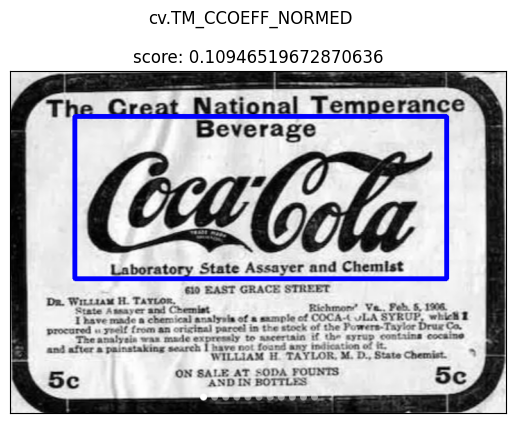

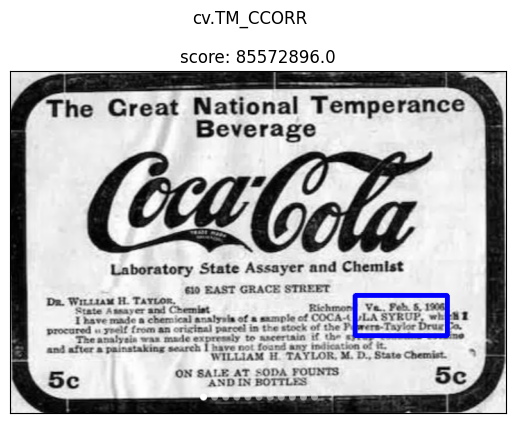

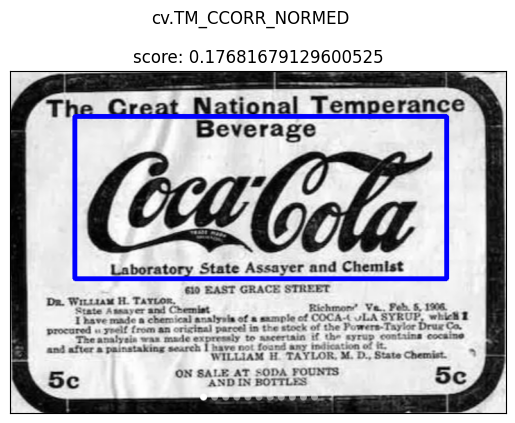

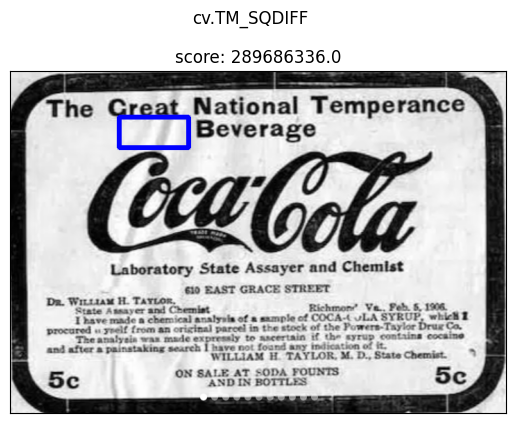

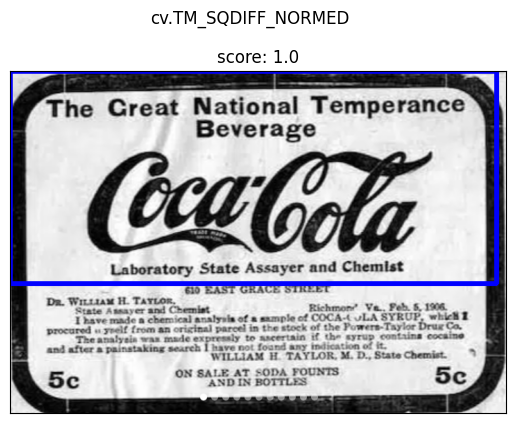

In [7]:
image_path = './images/coca_retro_1.png'
template_path = './template/pattern.png'

methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']


for meth in methods:    
    method = eval(meth)
    rgb_image, score = find_logo(image_path, template_path, method)
    
    plt.figure()
    
    plt.subplot(111),plt.imshow(rgb_image)
    plt.title(f'score: {score}'), plt.xticks([]), plt.yticks([])
    
    plt.suptitle(meth)
    plt.show()

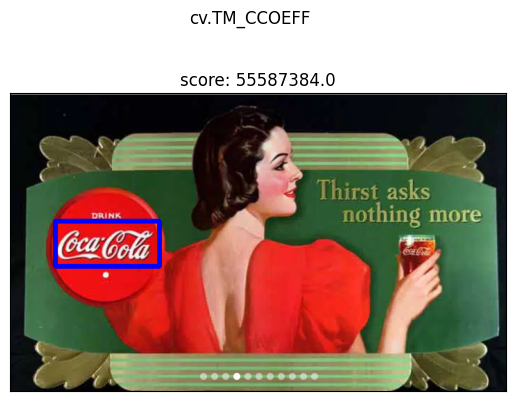

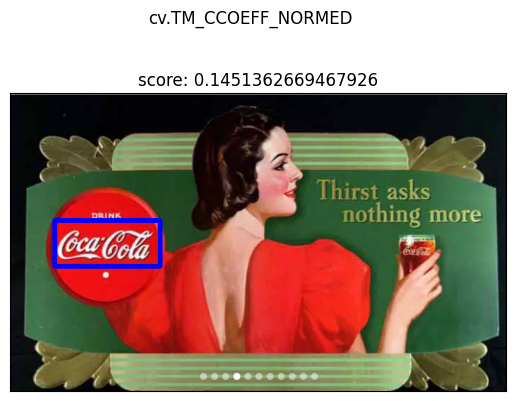

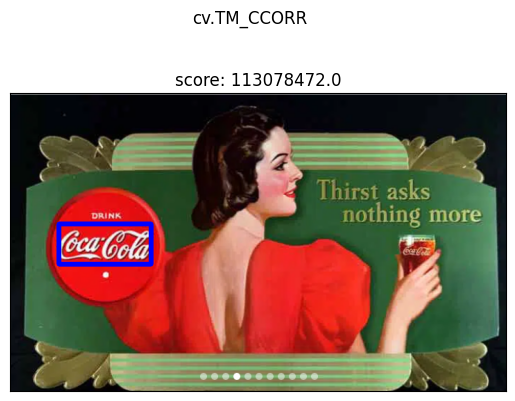

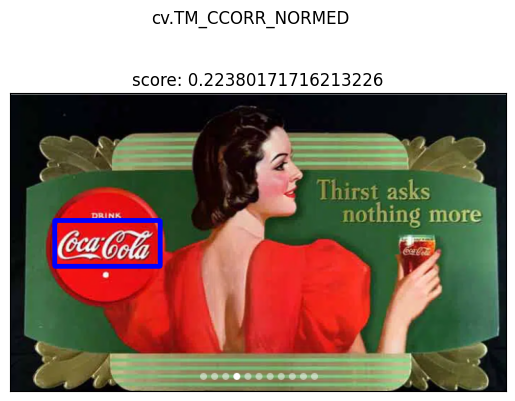

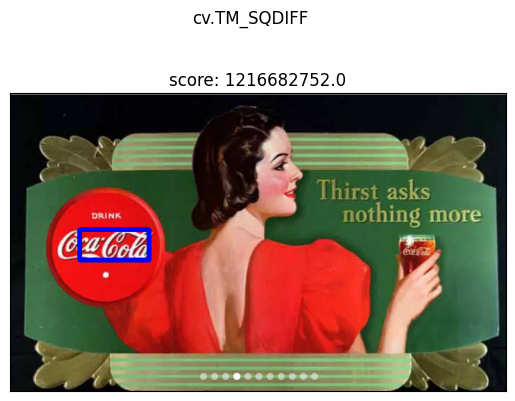

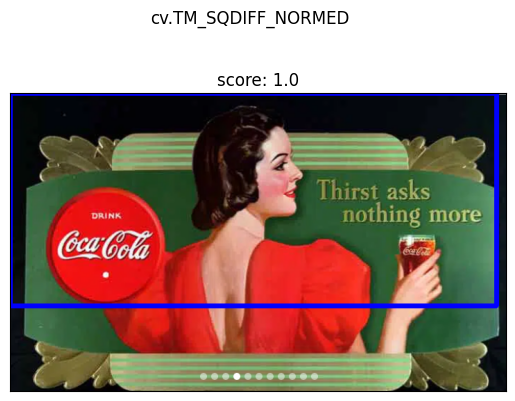

In [8]:
image_path = './images/coca_retro_2.png'
template_path = './template/pattern.png'

methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']


for meth in methods:    
    method = eval(meth)
    rgb_image, score = find_logo(image_path, template_path, method)
    
    plt.figure()
    
    plt.subplot(111),plt.imshow(rgb_image)
    plt.title(f'score: {score}'), plt.xticks([]), plt.yticks([])
    
    plt.suptitle(meth)
    plt.show()

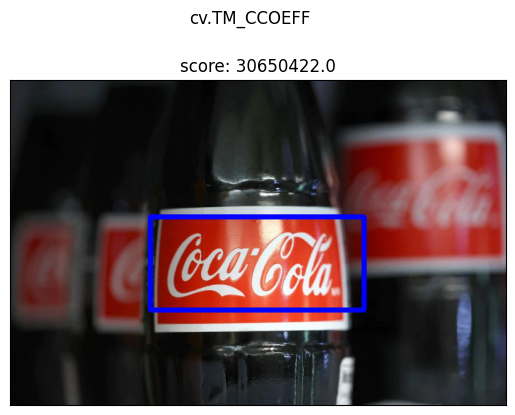

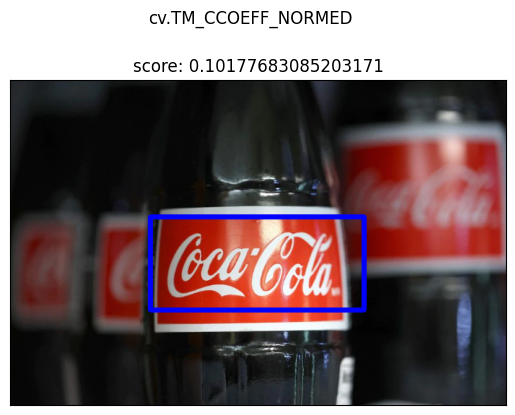

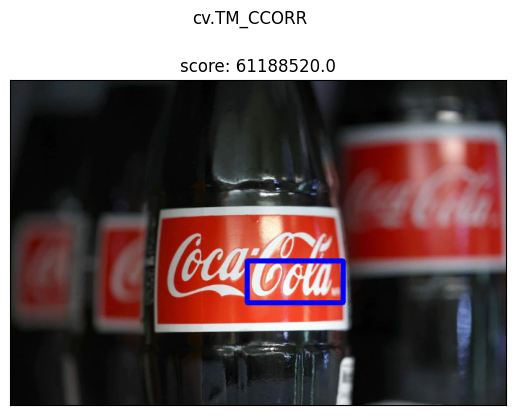

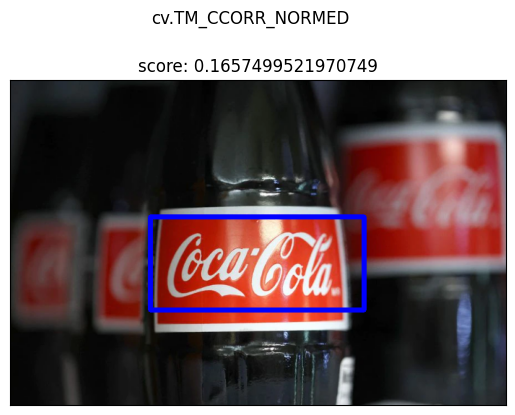

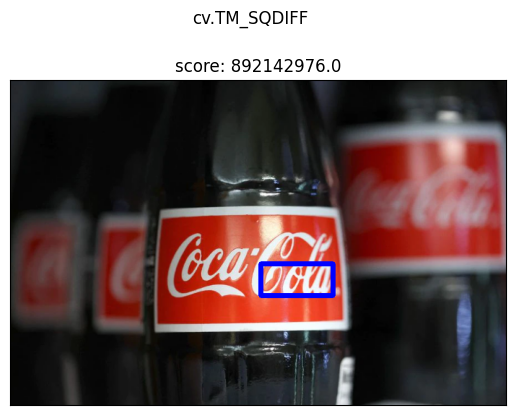

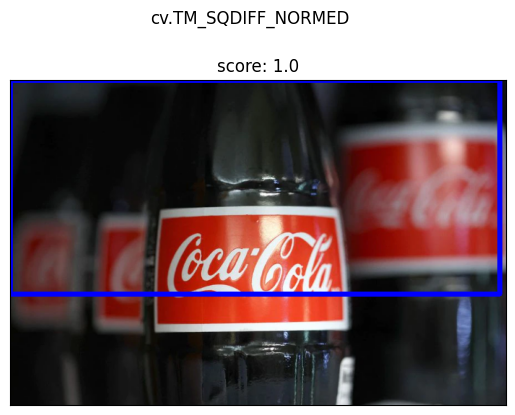

In [9]:
image_path = './images/logo_1.png'
template_path = './template/pattern.png'

methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']


for meth in methods:    
    method = eval(meth)
    rgb_image, score = find_logo(image_path, template_path, method)
    
    plt.figure()
    
    plt.subplot(111),plt.imshow(rgb_image)
    plt.title(f'score: {score}'), plt.xticks([]), plt.yticks([])
    
    plt.suptitle(meth)
    plt.show()

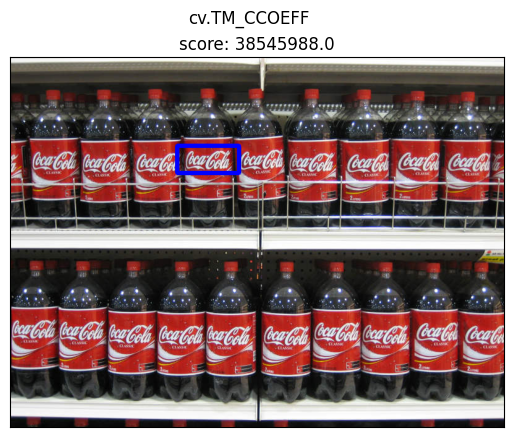

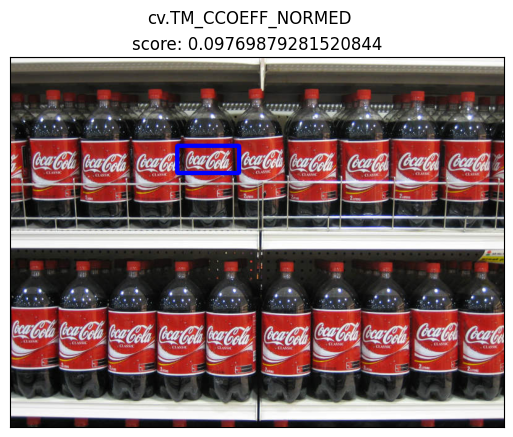

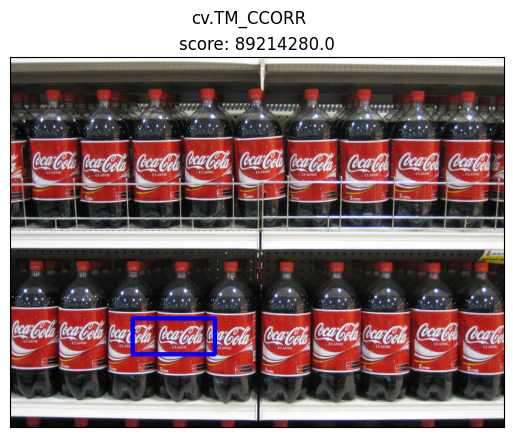

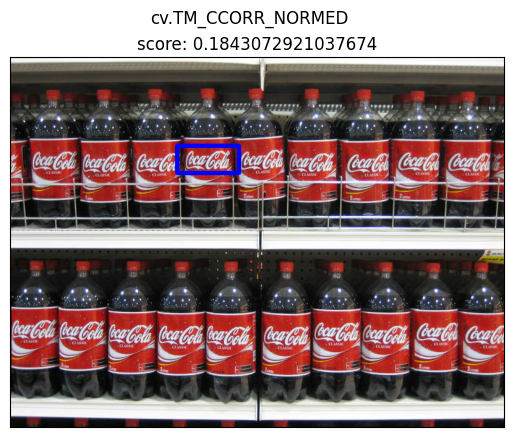

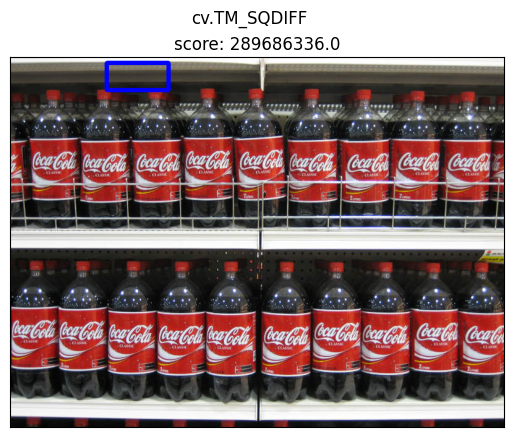

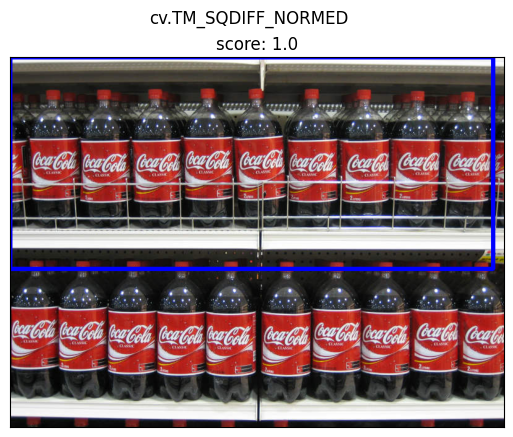

In [5]:
image_path = './images/coca_multi.png'
template_path = './template/pattern.png'

methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']


for meth in methods:    
    method = eval(meth)
    rgb_image, score = find_logo(image_path, template_path, method)
    
    plt.figure()
    
    plt.subplot(111),plt.imshow(rgb_image)
    plt.title(f'score: {score}'), plt.xticks([]), plt.yticks([])
    
    plt.suptitle(meth)
    plt.show()

Al evaluar los metodos disponibles se observa que en general los metodos cv.TM_SQDIFF y cv.TM_SQDIFF_NORMED no dan buenos resultados. Los que presentan mejores resultados son cv.TM_CCOEFF y cv.TM_CCOEFF_NORMED. El metodo que no presenta falsos positivos es el cv.TM_CCOEFF.